In [ ]:
!pip install -q kaggle


In [3]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [8]:
from google.colab import files
files.upload()

Saving hotel_bookings.csv to hotel_bookings.csv


{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date\nResort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NULL,NULL,0,Transient,75,0,0,Check-Out,2015-07-02\nResort Hotel,0,13,2015,July,27,1,0,1,1,

# **Initial Data Inspection**

In [9]:
hotel_bookings = pd.read_csv("/content/hotel_bookings.csv")

# Display the first few rows
print(hotel_bookings.head())

          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  ...  deposit_type  \
0                        0                     0       2  ...    No Deposit   
1     

In [10]:
print(hotel_bookings.dtypes)

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [11]:
# Basic dataset information
print("Dataset Shape:", hotel_bookings.shape)

Dataset Shape: (119390, 32)


In [12]:
print("\nColumn Names:")
print(hotel_bookings.columns.tolist())


Column Names:
['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date']


In [13]:
print("\nFirst 5 rows:\n", hotel_bookings.head())


First 5 rows:
           hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  ...  deposit_type  \
0                        0                     0       2  ...    No D

In [14]:
print("\nLast 5 rows:\n", hotel_bookings.tail())


Last 5 rows:
              hotel  is_canceled  lead_time  arrival_date_year  \
119385  City Hotel            0         23               2017   
119386  City Hotel            0        102               2017   
119387  City Hotel            0         34               2017   
119388  City Hotel            0        109               2017   
119389  City Hotel            0        205               2017   

       arrival_date_month  arrival_date_week_number  \
119385             August                        35   
119386             August                        35   
119387             August                        35   
119388             August                        35   
119389             August                        35   

        arrival_date_day_of_month  stays_in_weekend_nights  \
119385                         30                        2   
119386                         31                        2   
119387                         31                        2   
119388         

# **Missing Value Analysis**


In [15]:
missing_counts = hotel_bookings.isnull().sum()
columns_with_missing = missing_counts[missing_counts > 0]
print("Columns with missing values and counts:")
print(columns_with_missing)

Columns with missing values and counts:
children         4
country        488
agent        16340
company     112593
dtype: int64


In [16]:
missing_percentage = (columns_with_missing / len(hotel_bookings)) * 100
print("\nPercentage of missing values per column:")
print(missing_percentage)


Percentage of missing values per column:
children     0.003350
country      0.408744
agent       13.686238
company     94.306893
dtype: float64


In [17]:
missing_report = pd.DataFrame({
    'Missing Count': columns_with_missing,
    'Missing Percentage': missing_percentage
})
print("\nMissing Value Report:")
print(missing_report)


Missing Value Report:
          Missing Count  Missing Percentage
children              4            0.003350
country             488            0.408744
agent             16340           13.686238
company          112593           94.306893


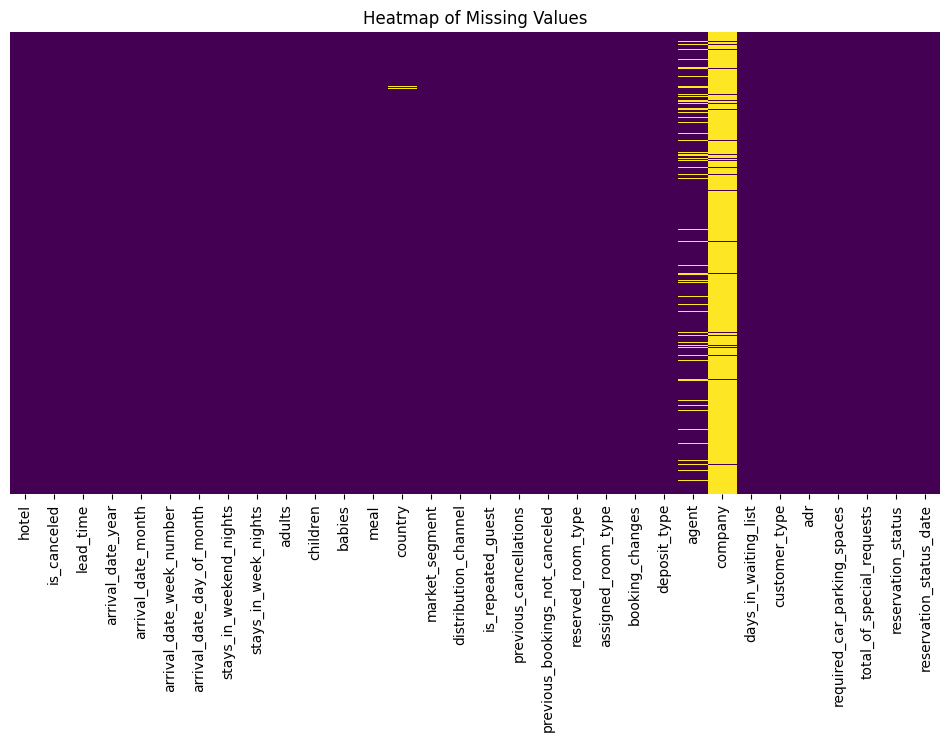

In [18]:
plt.figure(figsize=(12, 6))
sns.heatmap(hotel_bookings.isnull(), cbar=False, yticklabels=False, cmap='viridis')
plt.title('Heatmap of Missing Values')
plt.show()


In [19]:
for col in missing_report.index:
    if col == 'children':
        missing_report.at[col, 'Missing Type'] = 'MCAR'
    elif col == 'country':
        missing_report.at[col, 'Missing Type'] = 'MAR'
    elif col in ['agent', 'company']:
        missing_report.at[col, 'Missing Type'] = 'MNAR'
    else:
        missing_report.at[col, 'Missing Type'] = 'Unknown'

print("\nMissing Value Types:")
print(missing_report)


Missing Value Types:
          Missing Count  Missing Percentage Missing Type
children              4            0.003350         MCAR
country             488            0.408744          MAR
agent             16340           13.686238         MNAR
company          112593           94.306893         MNAR


In [20]:
missing_report['Missing Type'] = None

# **Data Quality Assessment**


In [21]:
# Check for exact duplicate rows
duplicates = hotel_bookings.duplicated()
print(f"Number of exact duplicate records: {duplicates.sum()}")

# Optionally, view some duplicate records
print("Sample duplicate records:")
print(hotel_bookings[duplicates].head())


Number of exact duplicate records: 31994
Sample duplicate records:
            hotel  is_canceled  lead_time  arrival_date_year  \
5    Resort Hotel            0         14               2015   
22   Resort Hotel            0         72               2015   
43   Resort Hotel            0         70               2015   
138  Resort Hotel            1          5               2015   
200  Resort Hotel            0          0               2015   

    arrival_date_month  arrival_date_week_number  arrival_date_day_of_month  \
5                 July                        27                          1   
22                July                        27                          1   
43                July                        27                          2   
138               July                        28                          5   
200               July                        28                          7   

     stays_in_weekend_nights  stays_in_week_nights  adults  ...  deposit_

           lead_time  stays_in_weekend_nights  stays_in_week_nights  \
count  119390.000000            119390.000000         119390.000000   
mean      104.011416                 0.927599              2.500302   
std       106.863097                 0.998613              1.908286   
min         0.000000                 0.000000              0.000000   
25%        18.000000                 0.000000              1.000000   
50%        69.000000                 1.000000              2.000000   
75%       160.000000                 2.000000              3.000000   
max       737.000000                19.000000             50.000000   

              adults       children         babies            adr  
count  119390.000000  119386.000000  119390.000000  119390.000000  
mean        1.856403       0.103890       0.007949     101.831122  
std         0.579261       0.398561       0.097436      50.535790  
min         0.000000       0.000000       0.000000      -6.380000  
25%         2.000000

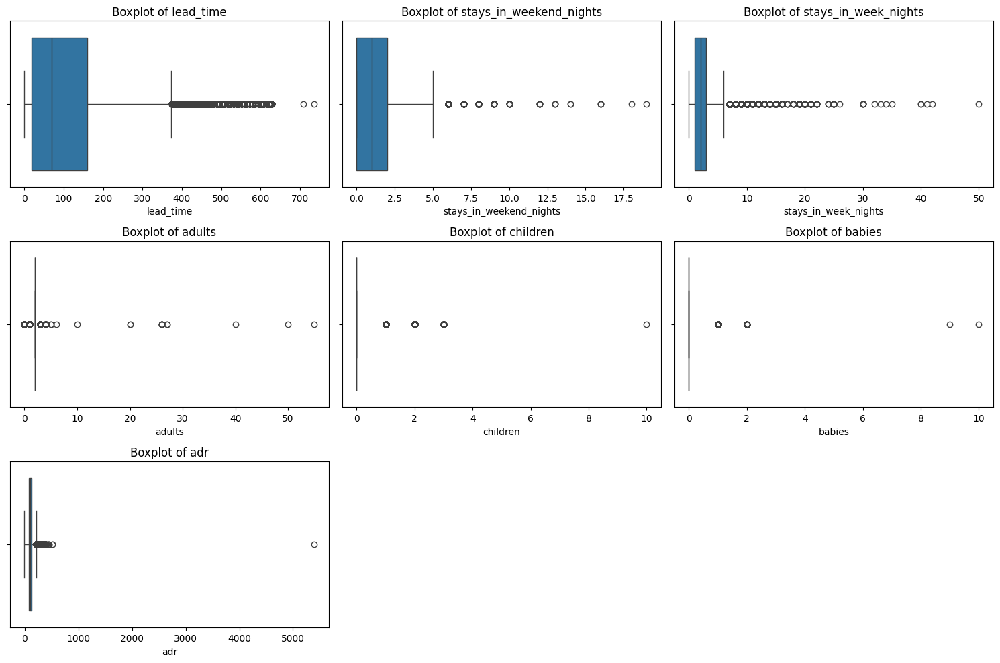

In [23]:
numerical_cols = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
                  'adults', 'children', 'babies', 'adr']

# Summary statistics
print(hotel_bookings[numerical_cols].describe())

# Visualize outliers using boxplots
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=hotel_bookings[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()


In [24]:
categorical_cols = ['hotel', 'arrival_date_month', 'country', 'meal', 'market_segment',
                    'distribution_channel', 'reserved_room_type', 'assigned_room_type',
                    'deposit_type', 'customer_type']

for col in categorical_cols:
    unique_vals = hotel_bookings[col].unique()
    print(f"\nUnique values in {col} ({len(unique_vals)}):")
    print(unique_vals)


Unique values in hotel (2):
['Resort Hotel' 'City Hotel']

Unique values in arrival_date_month (12):
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']

Unique values in country (178):
['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' nan 'ROU' 'NOR' 'OMN' 'ARG' 'POL'
 'DEU' 'BEL' 'CHE' 'CN' 'GRC' 'ITA' 'NLD' 'DNK' 'RUS' 'SWE' 'AUS' 'EST'
 'CZE' 'BRA' 'FIN' 'MOZ' 'BWA' 'LUX' 'SVN' 'ALB' 'IND' 'CHN' 'MEX' 'MAR'
 'UKR' 'SMR' 'LVA' 'PRI' 'SRB' 'CHL' 'AUT' 'BLR' 'LTU' 'TUR' 'ZAF' 'AGO'
 'ISR' 'CYM' 'ZMB' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN' 'ARE' 'TUN' 'JAM'
 'HRV' 'HKG' 'IRN' 'GEO' 'AND' 'GIB' 'URY' 'JEY' 'CAF' 'CYP' 'COL' 'GGY'
 'KWT' 'NGA' 'MDV' 'VEN' 'SVK' 'FJI' 'KAZ' 'PAK' 'IDN' 'LBN' 'PHL' 'SEN'
 'SYC' 'AZE' 'BHR' 'NZL' 'THA' 'DOM' 'MKD' 'MYS' 'ARM' 'JPN' 'LKA' 'CUB'
 'CMR' 'BIH' 'MUS' 'COM' 'SUR' 'UGA' 'BGR' 'CIV' 'JOR' 'SYR' 'SGP' 'BDI'
 'SAU' 'VNM' 'PLW' 'QAT' 'EGY' 'PER' 'MLT' 'MWI' 'ECU' 'MDG' 'ISL' 'UZB'
 'NPL' 'BHS' 'MAC' 'TGO' 

In [26]:
# Check for zero guests
zero_guests = hotel_bookings[(hotel_bookings['adults'] == 0) & (hotel_bookings['children'] == 0) & (hotel_bookings['babies'] == 0)]
print(f"\nNumber of bookings with zero guests: {len(zero_guests)}")

# Check for negative or zero ADR
negative_adr = hotel_bookings[hotel_bookings['adr'] <= 0]
print(f"\nNumber of records with non-positive ADR: {len(negative_adr)}")

# Check for negative lead_time
negative_lead_time = hotel_bookings[hotel_bookings['lead_time'] < 0]
print(f"\nNumber of records with negative lead_time: {len(negative_lead_time)}")

# Additional checks
# Could also check for logical inconsistencies like arrival_date_year outside 2015-2017 range
invalid_year = hotel_bookings[~hotel_bookings['arrival_date_year'].isin([2015, 2016, 2017])]
print(f"\nNumber of records with invalid arrival year: {len(invalid_year)}")



Number of bookings with zero guests: 180

Number of records with non-positive ADR: 1960

Number of records with negative lead_time: 0

Number of records with invalid arrival year: 0


# **Handling Missing Values**

In [28]:
# 1. Children column: Replace NaN with 0
hotel_bookings['children'].fillna(0, inplace=True)

# 2. Country column: Investigate missing values pattern
print("Missing values in 'country':", hotel_bookings['country'].isna().sum())

# Check distribution of countries where 'country' is missing
print(hotel_bookings[hotel_bookings['country'].isna()].head())

# Strategy: Replace missing 'country' with 'Unknown'
hotel_bookings['country'].fillna('Unknown', inplace=True)

# 3. Agent column: Replace NaN with 0
hotel_bookings['agent'].fillna(0, inplace=True)

# 4. Company column: Replace NaN with 0
hotel_bookings['company'].fillna(0, inplace=True)

# Verify no missing values remain in these columns
print(hotel_bookings[['children', 'country', 'agent', 'company']].isna().sum())


Missing values in 'country': 488
             hotel  is_canceled  lead_time  arrival_date_year  \
30    Resort Hotel            0        118               2015   
4127  Resort Hotel            1          0               2016   
7092  Resort Hotel            1          8               2016   
7860  Resort Hotel            1         39               2016   
8779  Resort Hotel            1          0               2016   

     arrival_date_month  arrival_date_week_number  arrival_date_day_of_month  \
30                 July                        27                          1   
4127           February                         8                         15   
7092               July                        30                         21   
7860             August                        36                         30   
8779            October                        42                         13   

      stays_in_weekend_nights  stays_in_week_nights  adults  ...  \
30                         

# **Duplicate Detection and Removal**

In [ ]:
# Check exact duplicates
duplicates = df.duplicated()
print(f"Number of exact duplicates: {duplicates.sum()}")

# Remove exact duplicates
df = df.drop_duplicates()
print(f"Dataset shape after removing duplicates: {df.shape}")

# Near-duplicates detection (simple approach: using subset of columns)
# Example: bookings with same 'hotel', 'arrival_date', 'lead_time', 'adults', 'children', 'babies'
subset_cols = ['hotel', 'arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month',
               'lead_time', 'adults', 'children', 'babies']
near_duplicates = df.duplicated(subset=subset_cols, keep=False)
print(f"Number of near-duplicates based on subset: {near_duplicates.sum()}")

# Optional: You can investigate near duplicates further or decide on strategy


Number of exact duplicates: 31994
Dataset shape after removing duplicates: (87396, 32)
Number of near-duplicates based on subset: 36767


In [1]:
columns_to_check = [
    'lead_time',
    'stays_in_weekend_nights',
    'stays_in_week_nights',
    'adults',
    'children',
    'babies',
    'adr'
]